In [19]:
import pandas as pd
import networkx as nx
from itertools import combinations
from scipy.stats import spearmanr
import numpy as np
import pickle as pkl
from multiprocessing import Pool
from tqdm import tqdm
import matplotlib.pyplot as plt

In [20]:
df = pd.read_csv("/shared/norm_count.csv", index_col = 0)
# Multiindex columns to be (cellline, gene, shRNA, replicate)
df.columns=pd.MultiIndex.from_tuples([tuple(x.split()[-4:]) for x in df.columns])
genes = sorted(set(x[1] for x in df.columns))
genes.remove("CTRL")
systems = sorted(set(x[1] for x in df.columns))
networks = {x: None for x in systems}
corr = {x: None for x in systems}
for g in systems:
    data = df.xs(g, axis=1, level=1, drop_level=False).loc[genes]
    spearman = pd.DataFrame(0, columns=genes, index=genes)
    for i, j in combinations(genes, 2):
        spearman.loc[i,j] = spearmanr(data.loc[i], data.loc[j])[0]
    spearman += spearman.T
    np.fill_diagonal(spearman.values, 1.0)
    corr[g] = spearman
pkl.dump(corr, open("/shared/tony/corr_coeff_20_spearman.pkl", "wb"))
change = []
for i, j in combinations(systems, 2):
    data = abs(corr[i] - corr[j])
    change += [((i, j), (genes[x[0]], genes[x[1]], data.loc[genes[x[0]], genes[x[1]]], corr[i].loc[genes[x[0]], genes[x[1]]], corr[j].loc[genes[x[0]], genes[x[1]]])) for x in np.argwhere(np.triu(data.values) > 0.5)]
len(change)
s = sorted(change, key=lambda x: x[1][2], reverse=True)
pkl.dump(s, open("/shared/tony/change_20_spearman.pkl", "wb"))
with open("/shared/tony/change_20_spearman.csv", "w") as f:
    f.write("sys1,sys2,gene1,gene2,corr_change,sys1_corr,sys2_corr\n")
    for i in s:
        f.write(",".join([str(y) for x in i for y in x]) + "\n")

In [21]:
def normalise(p, n):
    p = np.array(p)
    n = np.array(n)
    small = min(min(p), min(abs(n)))
    large = max(max(p), max(abs(n)))
    p = (p - small) / large
    n = (n + small) / large
    return p, n

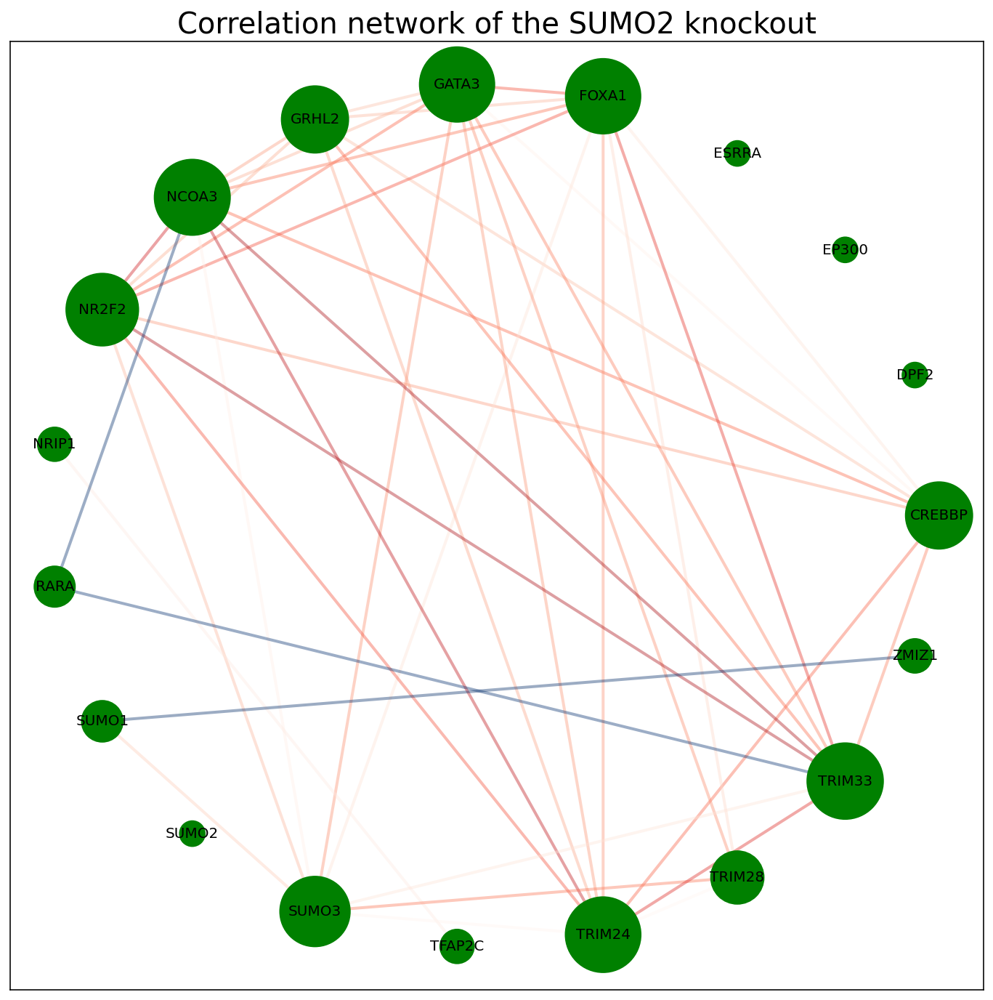

In [22]:
def corr_to_g(df, knockout, cut=0, norm=False):
    G = nx.Graph()
    pcolors = []
    ncolors = []
    positive = []
    negative = []
    node_colours = np.array(abs(df[abs(df) > cut]).sum()) * 300
    for x, y in np.argwhere(abs(np.triu(df.values)) > cut):
        if df.loc[genes[x], genes[y]] > 0:
            G.add_edge(genes[x], genes[y], weight=df.loc[genes[x], genes[y]])
            pcolors.append(df.loc[genes[x], genes[y]])
            positive.append((genes[x], genes[y]))
        elif df.loc[genes[x], genes[y]] < 0:
            G.add_edge(genes[x], genes[y], weight=abs(df.loc[genes[x], genes[y]]))
            ncolors.append(abs(df.loc[genes[x], genes[y]]))
            negative.append((genes[x], genes[y]))
    fig = plt.figure(figsize=(12, 12))
    pos = nx.circular_layout(genes)
    if norm:
        pcolors, ncolors = normalise(pcolors, ncolors)
    nx.draw_networkx_nodes(G, pos, alpha=1.0, node_size=node_colours, node_color="g", cmap=plt.cm.Greens, nodelist=genes)
    nx.draw_networkx_edges(G, pos, edge_color=pcolors, edgelist= positive, edge_cmap=plt.cm.Reds, edge_vmin=0.0, width=2.0, alpha=0.4, min_source_margin=25, min_target_margin=25)
    nx.draw_networkx_edges(G, pos, edge_color=ncolors, edgelist= negative, edge_cmap=plt.cm.Blues, edge_vmin=0.0, width=2.0, alpha=0.4, min_source_margin=25, min_target_margin=25)
    nx.draw_networkx_labels(G, pos, font_size=10)
    if knockout == "CTRL":
        plt.title("Correlation network of the control sample", fontsize=20)
    else:
        plt.title(f"Correlation network of the {knockout} knockout", fontsize=20)
    return fig
corr_to_g(corr["SUMO2"], "SUMO2", 0.8, True).show()

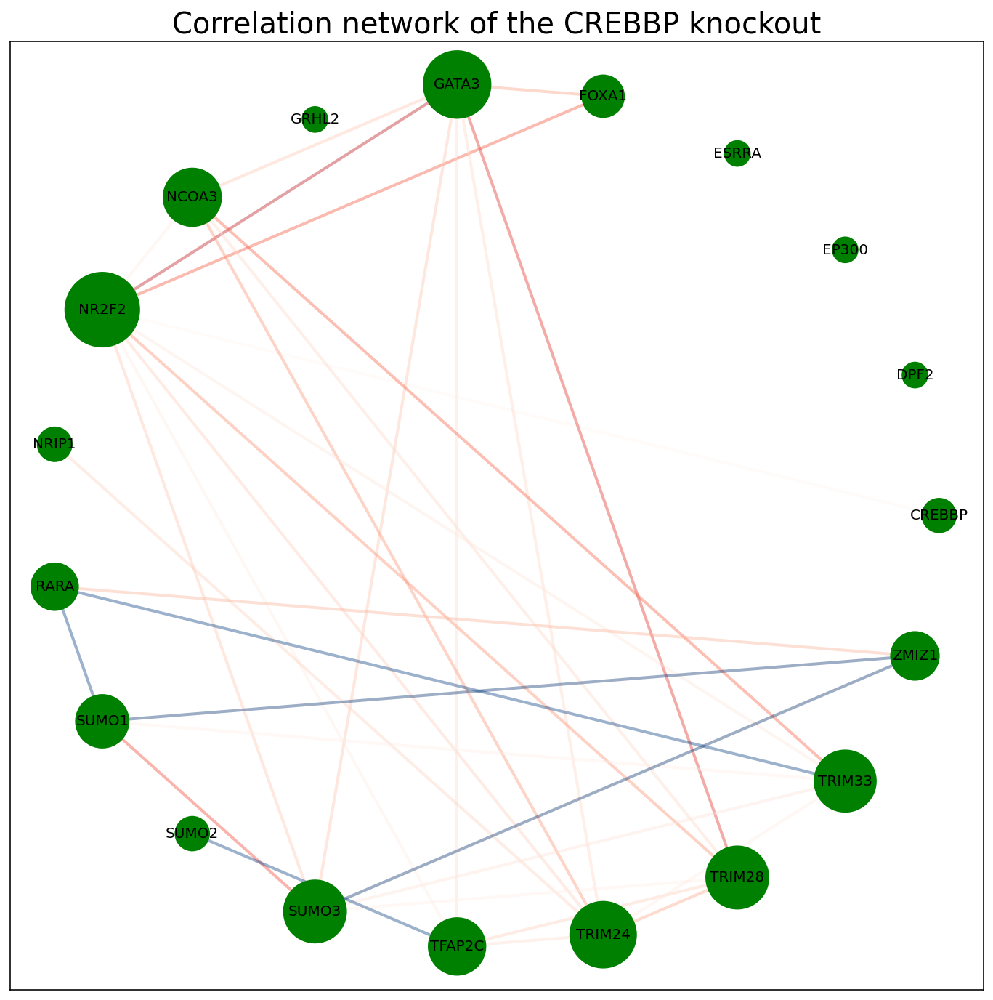

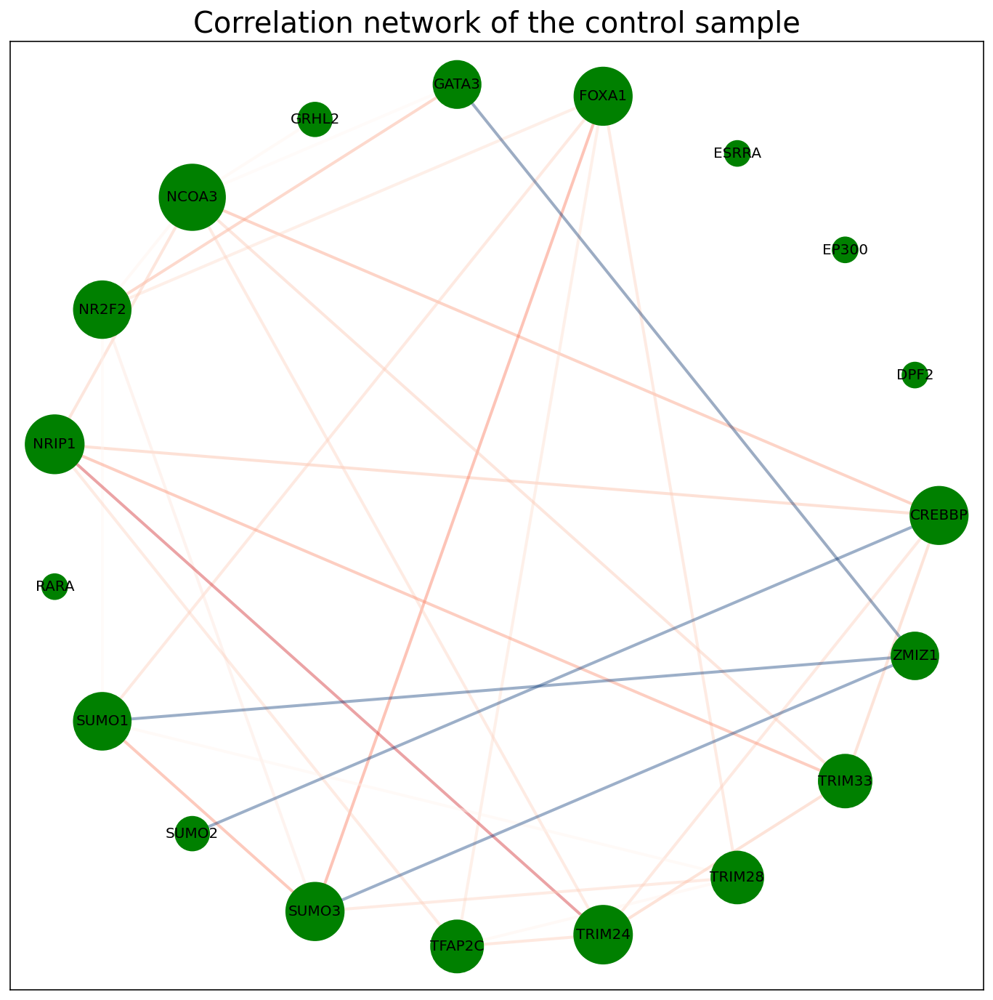

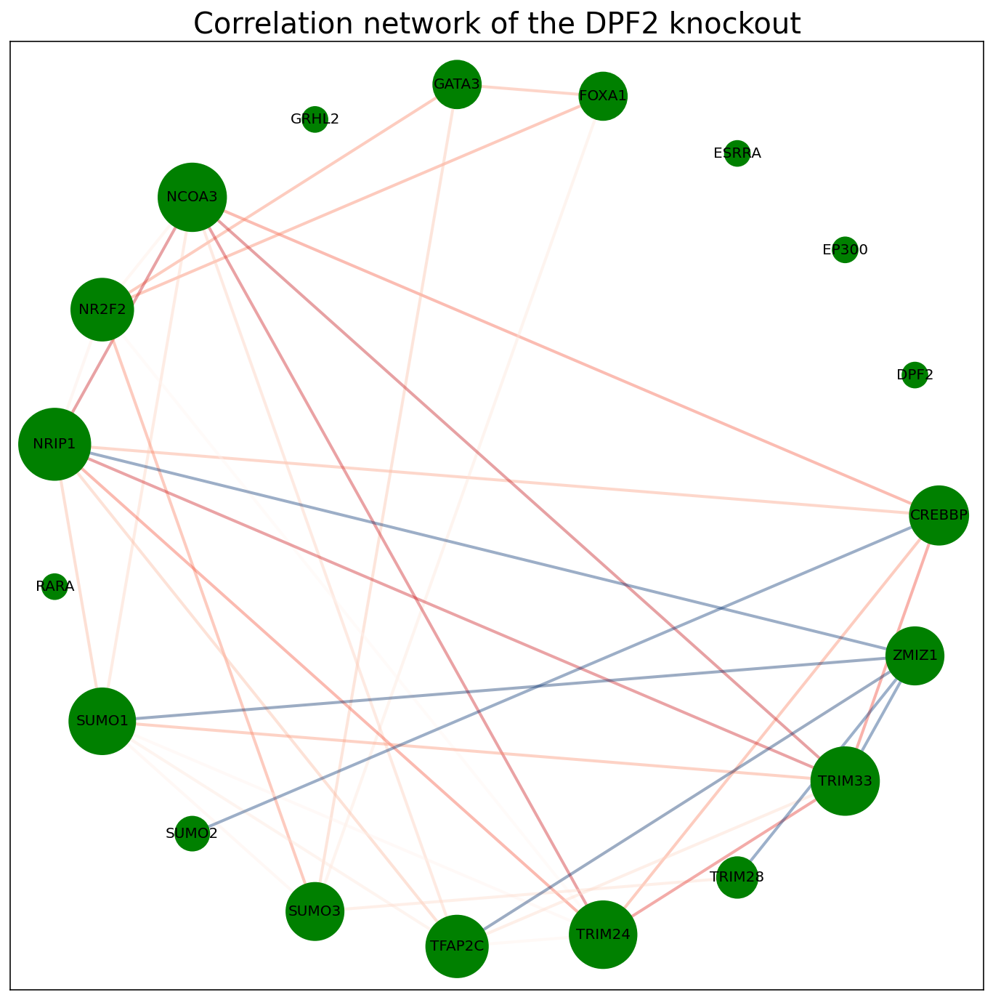

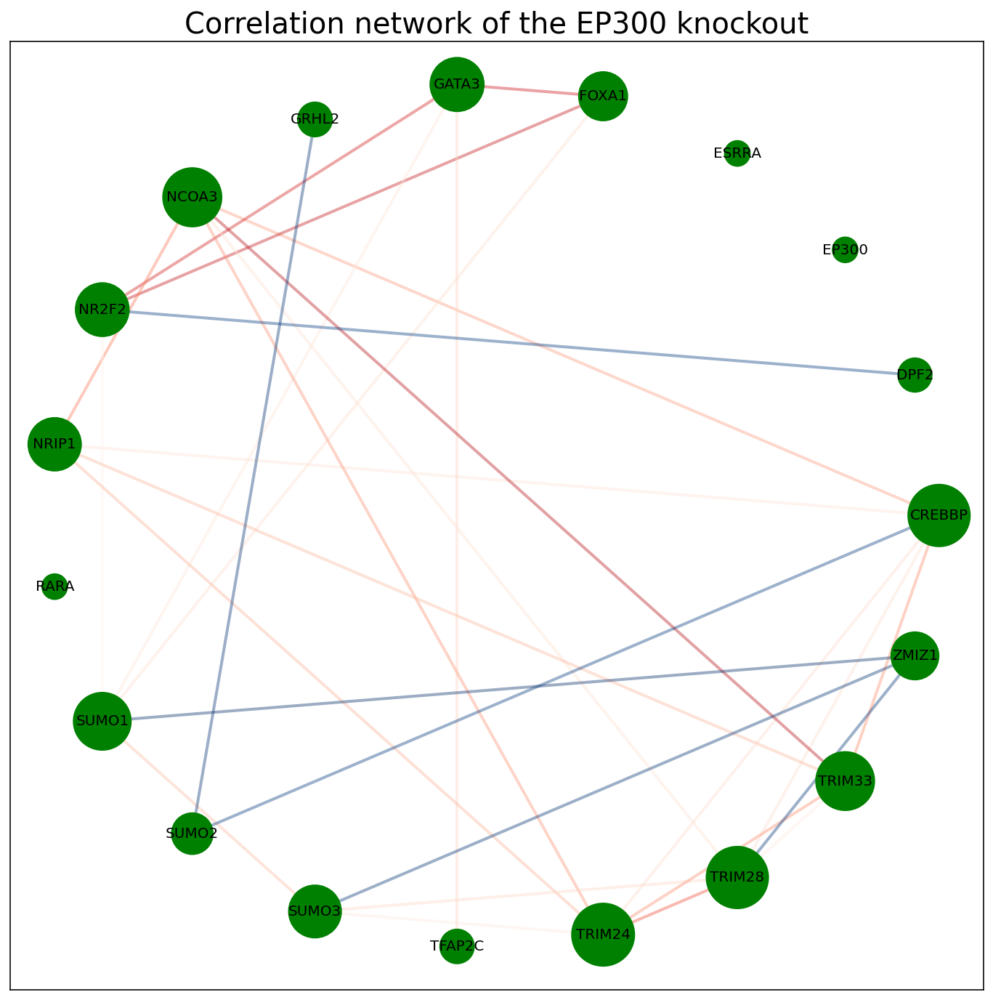

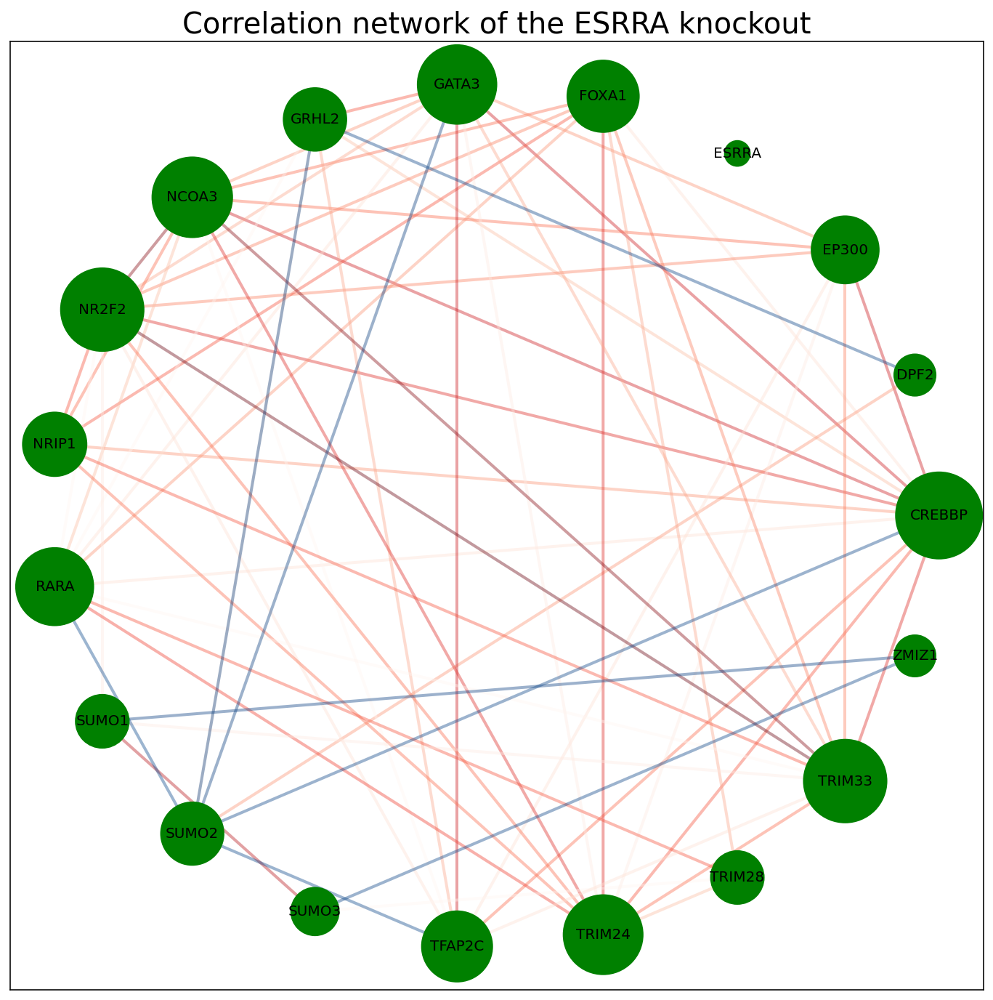

...

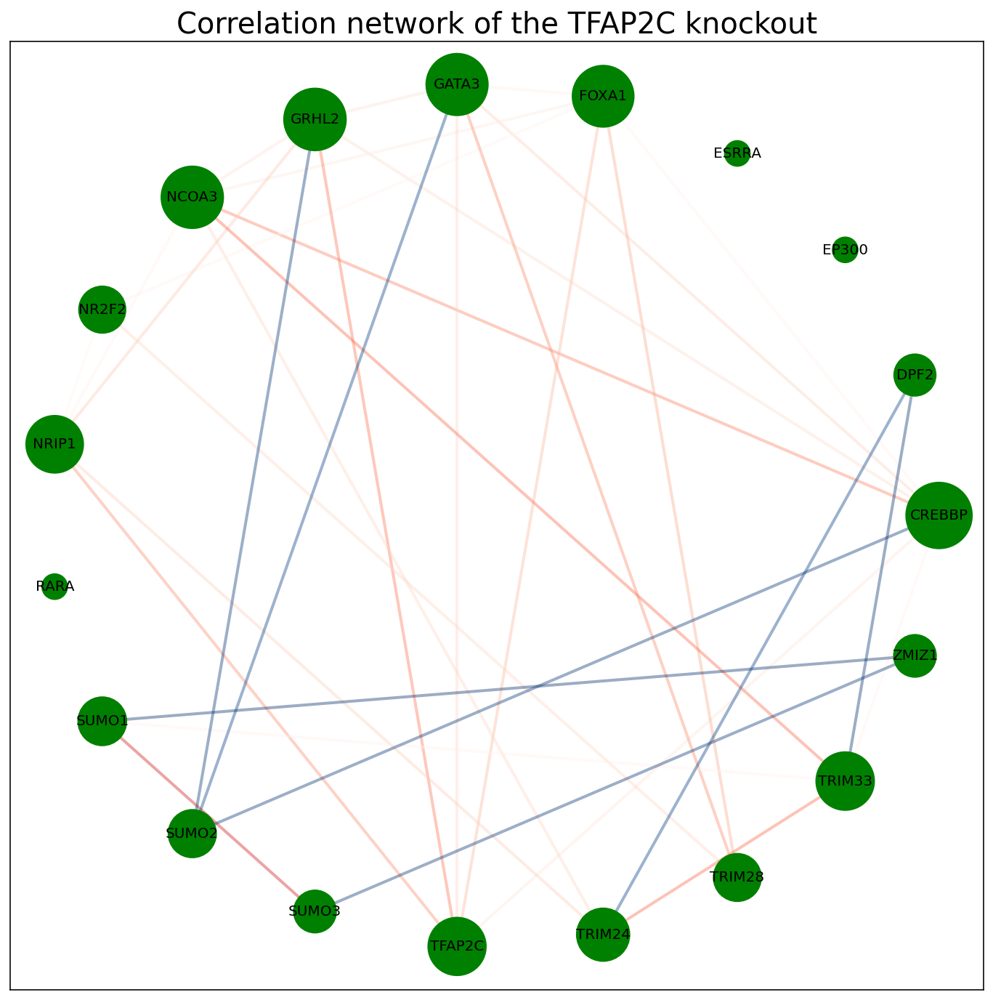

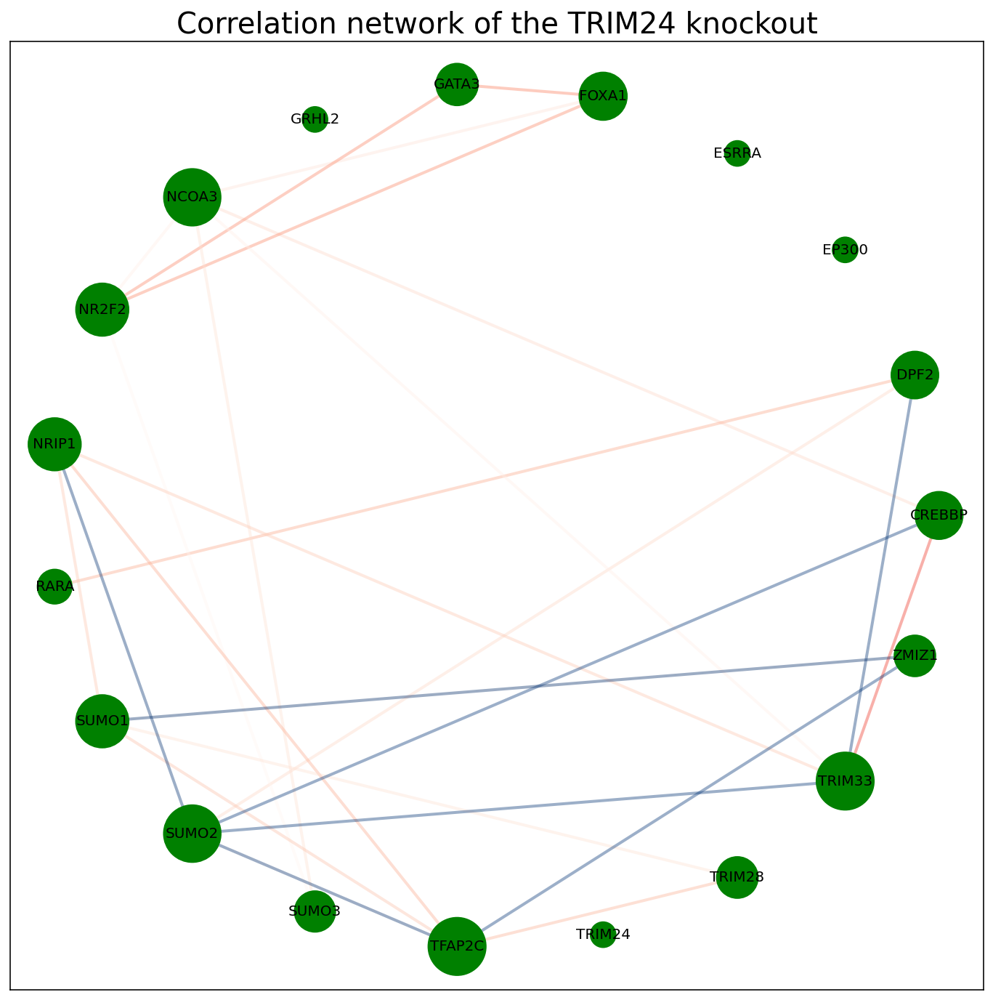

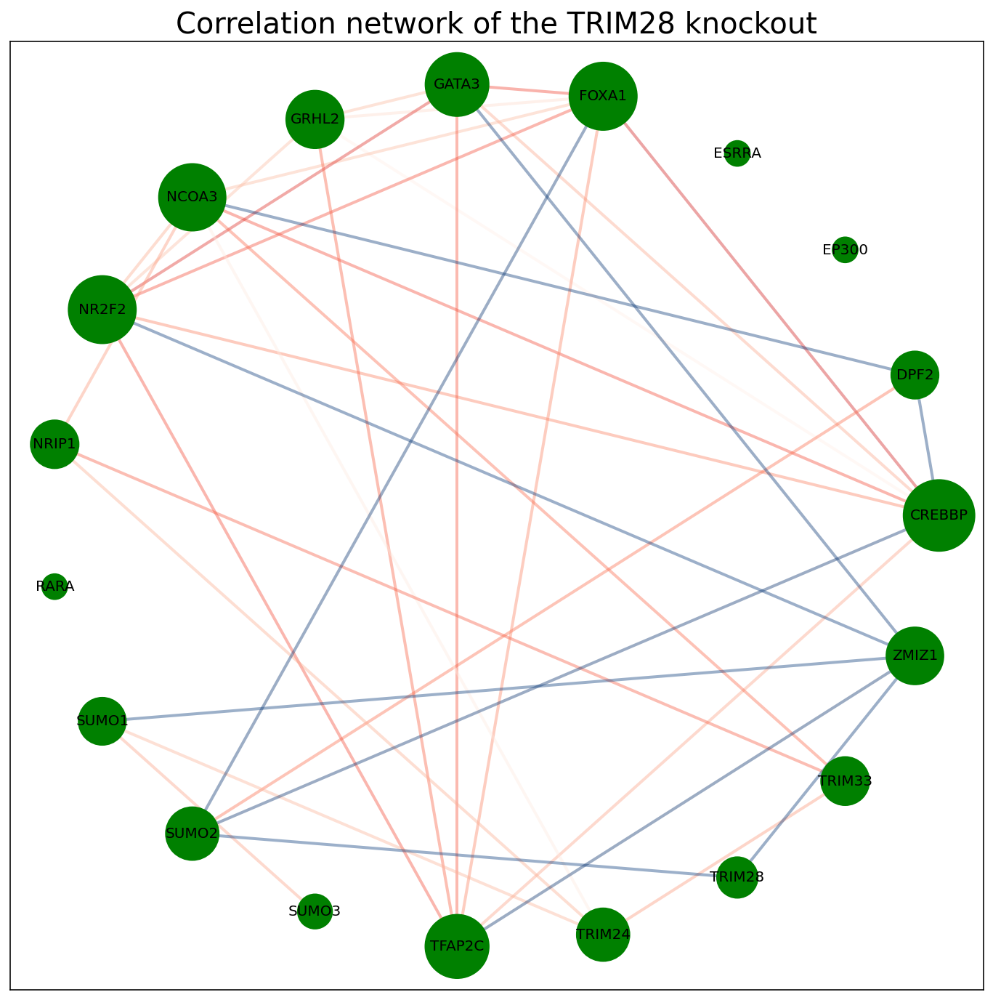

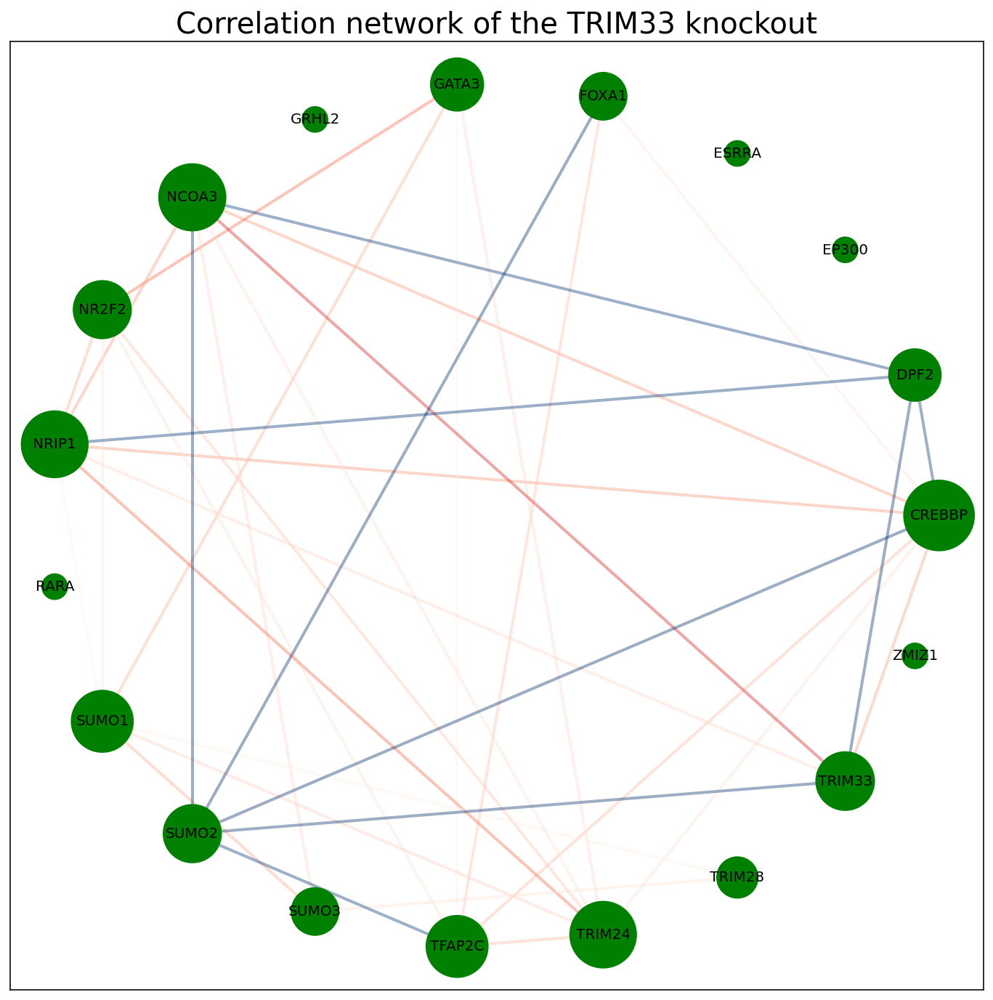

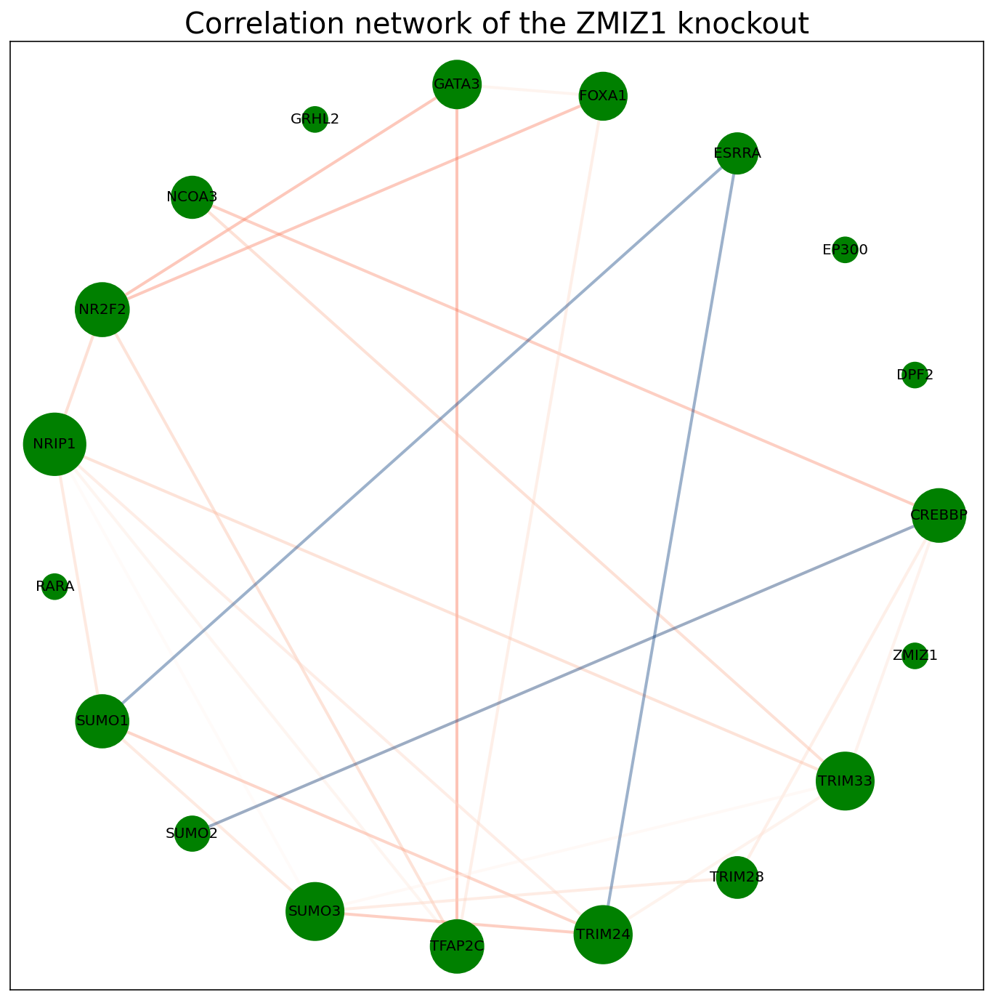

In [23]:
for i in systems:
    corr_to_g(corr[i], i, 0.8, True).savefig(f"/shared/tony/plots/spearman_correlation_network_{i}.png")

In [24]:
large_genes = []
for g in genes:
    data = pd.read_csv(f"/shared/DE_DESeq/CTRL_vs_{g}_results_DESeq.csv", index_col=0)
    large_genes += list(data[data.padj < 0.05].sort_values("padj").index[:100])

In [25]:
large_genes = sorted(set(large_genes))

In [26]:
def calc_spearman(data, gene_list):
    spearman = pd.DataFrame(0, columns=gene_list, index=gene_list)
    for i, j in tqdm(list(combinations(gene_list, 2))):
        spearman.loc[i,j] = spearmanr(data.loc[i], data.loc[j])[0]
    spearman += spearman.T
    np.fill_diagonal(spearman.values, 1.0)
    return spearman

In [11]:
df = pd.read_csv("/shared/norm_count.csv", index_col = 0)
# Multiindex columns to be (cellline, gene, shRNA, replicate)
df.columns=pd.MultiIndex.from_tuples([tuple(x.split()[-4:]) for x in df.columns])
systems = sorted(set(x[1] for x in df.columns))
networks = {x: None for x in systems}
corr = {x: None for x in systems}
for g in systems:
    data = df.xs(g, axis=1, level=1, drop_level=False).loc[large_genes]
    spearman = pd.DataFrame(0, columns=large_genes, index=large_genes)
    for i, j in combinations(large_genes, 2):
        spearman.loc[i,j] = spearmanr(data.loc[i], data.loc[j])[0]
    spearman += spearman.T
    np.fill_diagonal(spearman.values, 1.0)
    corr[g] = spearman
pkl.dump(corr, open("/shared/tony/corr_coeff_large_spearman.pkl", "wb"))
change = []
for i, j in combinations(systems, 2):
    data = abs(corr[i] - corr[j])
    change += [((i, j), (large_genes[x[0]], large_genes[x[1]], data.loc[large_genes[x[0]], large_genes[x[1]]], corr[i].loc[large_genes[x[0]], large_genes[x[1]]], corr[j].loc[large_genes[x[0]], large_genes[x[1]]])) for x in np.argwhere(np.triu(data.values) > 0.5)]
s = sorted(change, key=lambda x: x[1][2], reverse=True)
pkl.dump(s, open("/shared/tony/change_large_spearman.pkl", "wb"))
with open("/shared/tony/change_large_spearman.csv", "w") as f:
    f.write("sys1,sys2,gene1,gene2,corr_change,sys1_corr,sys2_corr\n")
    for i in s:
        f.write(",".join([str(y) for x in i for y in x]) + "\n")

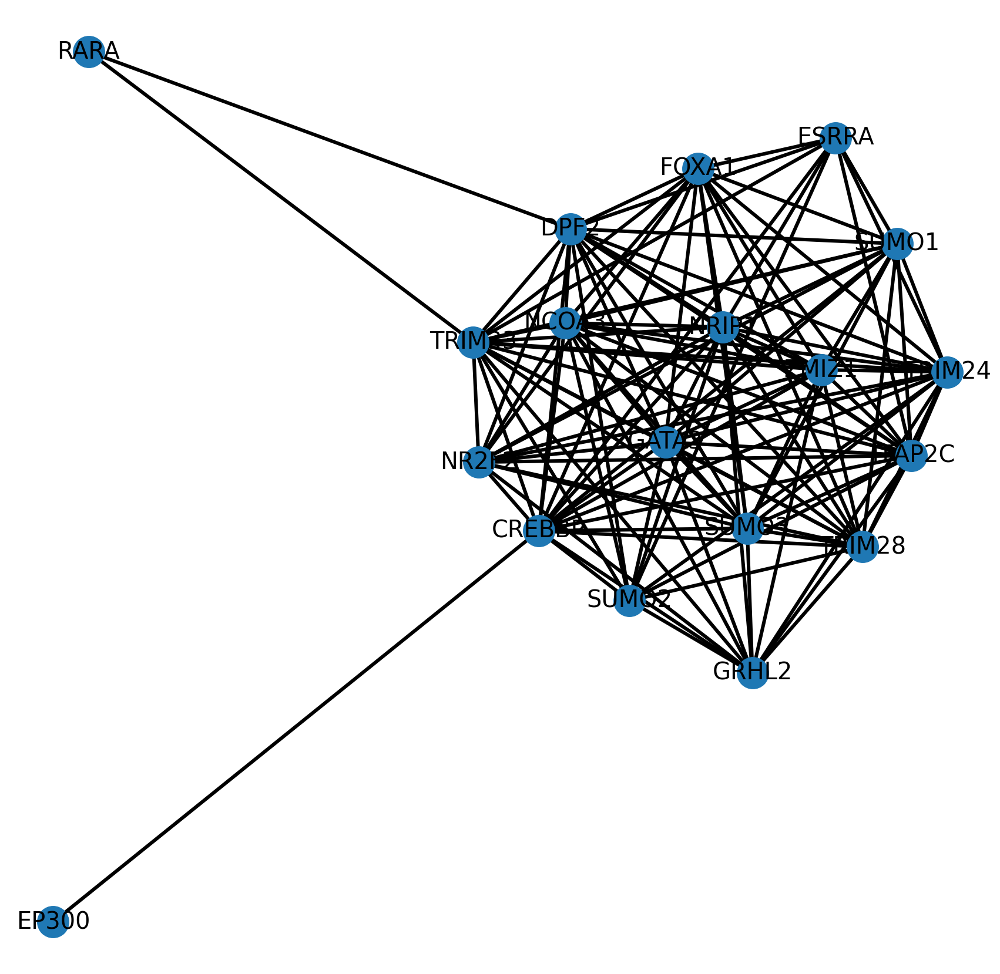

In [27]:
def mat_to_net(df):
    G = nx.Graph()
    posi = []
    neg = []
    for x in np.argwhere(abs(np.triu(df.values)) > 0.5):
        G.add_edge(genes[x[0]], genes[x[1]], weight=1/abs(df.loc[genes[x[0]], genes[x[1]]]))
        if df.loc[genes[x[0]], genes[x[1]]] > 0.5:
            posi.append((genes[x[0]], genes[x[1]]))
        elif df.loc[genes[x[0]], genes[x[1]]] < -0.5:
            neg.append((genes[x[0]], genes[x[1]]))
    pos = nx.spring_layout(G)  # positions for all nodes

    plt.figure(figsize=(15, 15))
    # nodes
    nx.draw_networkx_nodes(G, pos, node_size=700)
    colors = range(21)
    # edges
    nx.draw_networkx_edges(G, pos, width=3)
#     nx.draw_networkx_edges(
#         G, pos, edgelist=neg, width=3, alpha=0.5, edge_color="b", style="dashed"
#     )

    # labels
    nx.draw_networkx_labels(G, pos, font_size=20, font_family="sans-serif")

    plt.axis("off")
    return plt.show()
mat_to_net(corr["CTRL"])

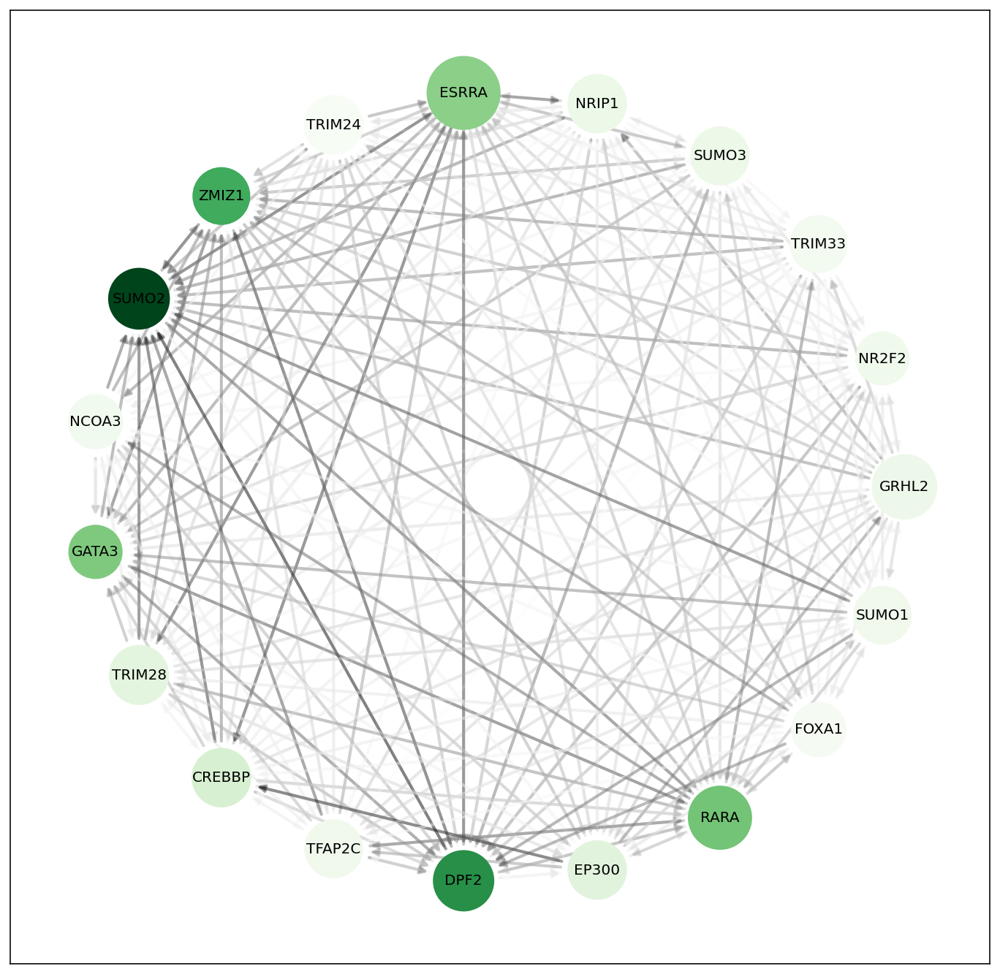

In [28]:
genes = ['GRHL2', 'NR2F2', 'TRIM33', 'SUMO3', 'NRIP1', 'ESRRA', 'TRIM24',
       'ZMIZ1', 'SUMO2', 'NCOA3', 'GATA3', 'TRIM28', 'CREBBP', 'TFAP2C',
       'DPF2', 'EP300', 'RARA', 'FOXA1', 'SUMO1']
d = pd.concat([(corr[g] - corr['CTRL'])[g] for g in genes], axis=1)
d = abs(d).reindex(index=genes)
cut = 0
d[d<cut] = 0
G = nx.DiGraph()
G.add_nodes_from(np.arange(0, len(d.columns), 1))
labels = {}
node_colors = []
colors = []
sizes = []
for idx, node in enumerate(G.nodes()):
    labels[node] = d.columns.values[idx]
for i in range(0, len(d.columns)):
    sizes.append(300 * np.sum(d.iloc[i, :]))
    node_colors.append(np.sum(d.iloc[:, i]))
    for j in range(0, len(d.columns)):
        if i != j and d.iloc[i, j] != 0:
            G.add_edge(i, j)
            colors.append(d.iloc[i, j])
colors = (np.array(colors) - cut) / (max(colors) - cut)
plt.figure(figsize=(12, 12))
pos = nx.circular_layout(G)
nx.draw_networkx_nodes(G, pos, node_color=node_colors, cmap=plt.cm.Greens, node_size=sizes, alpha=1.0)
nx.draw_networkx_edges(G, pos, edge_color=colors, edge_cmap=plt.cm.binary, edge_vmin=0.0, width=2.0, arrowstyle='-|>', alpha=0.4, min_source_margin=25, min_target_margin=25)
nx.draw_networkx_labels(G, pos, labels, font_size=10)
plt.show()

In [29]:
corr["SUMO1"]


,CREBBP,DPF2,EP300,ESRRA,FOXA1,GATA3,GRHL2,NCOA3,NR2F2,NRIP1,RARA,SUMO1,SUMO2,SUMO3,TFAP2C,TRIM24,TRIM28,TRIM33,ZMIZ1
CREBBP,1.000000,-0.412587,0.720280,-0.489510,0.706294,0.818182,0.797203,0.643357,0.552448,0.601399,-0.006993,0.692308,-0.608392,0.601399,0.881119,0.818182,0.839161,0.573427,-0.580420
DPF2,-0.412587,1.000000,-0.384615,0.741259,-0.440559,-0.307692,-0.552448,-0.671329,-0.615385,-0.629371,0.566434,-0.608392,0.034965,-0.433566,-0.461538,-0.419580,-0.279720,-0.629371,0.573427
EP300,0.720280,-0.384615,1.000000,-0.398601,0.713287,0.741259,0.342657,0.538462,0.426573,0.482517,-0.426573,0.538462,-0.279720,0.678322,0.692308,0.510490,0.741259,0.503497,-0.377622
ESRRA,-0.489510,0.741259,-0.398601,1.000000,-0.321678,-0.293706,-0.580420,-0.790210,-0.664336,-0.706294,0.398601,-0.608392,0.055944,-0.671329,-0.391608,-0.517483,-0.342657,-0.587413,0.678322
FOXA1,0.706294,-0.440559,0.713287,-0.321678,1.000000,0.930070,0.601399,0.615385,0.734266,0.629371,-0.167832,0.643357,-0.321678,0.762238,0.867133,0.713287,0.902098,0.713287,-0.622378
GATA3,0.818182,-0.307692,0.741259,-0.293706,0.930070,1.000000,0.629371,0.545455,0.608392,0.531469,-0.020979,0.601399,-0.475524,0.741259,0.944056,0.818182,0.986014,0.580420,-0.587413
GRHL2,0.797203,-0.552448,0.342657,-0.580420,0.601399,0.629371,1.000000,0.755245,0.762238,0.825175,-0.083916,0.790210,-0.398601,0.552448,0.685315,0.825175,0.622378,0.748252,-0.825175
NCOA3,0.643357,-0.671329,0.538462,-0.790210,0.615385,0.545455,0.755245,1.000000,0.916084,0.916084,-0.482517,0.790210,-0.013986,0.811189,0.559441,0.650350,0.573427,0.909091,-0.902098
NR2F2,0.552448,-0.615385,0.426573,-0.664336,0.734266,0.608392,0.762238,0.916084,1.000000,0.930070,-0.398601,0.818182,0.083916,0.811189,0.566434,0.713287,0.608392,0.937063,-0.944056
NRIP1,0.601399,-0.629371,0.482517,-0.706294,0.629371,0.531469,0.825175,0.916084,0.930070,1.000000,-0.524476,0.818182,0.027972,0.727273,0.489510,0.664336,0.531469,0.923077,-0.930070


In [30]:
genes = ['GRHL2', 'NR2F2', 'TRIM33', 'SUMO3', 'NRIP1', 'ESRRA', 'TRIM24',
       'ZMIZ1', 'SUMO2', 'NCOA3', 'GATA3', 'TRIM28', 'CREBBP', 'TFAP2C',
       'DPF2', 'EP300', 'RARA', 'FOXA1', 'SUMO1']

In [31]:
cut = 0.5

In [32]:
# d = pd.concat([(corr[g] - corr['CTRL'])[((abs(corr[g]) > cut) & (abs(corr['CTRL']) > cut))].loc[g:g] for g in genes], axis=0).reindex(genes, axis=1)

rows = []
for g in genes:
    selection = (abs(corr[g]) > cut) & (abs(corr['CTRL']) > cut)
    rows.append((corr[g] - corr['CTRL'])[selection].loc[g:g])
d = pd.concat(rows).reindex(genes, axis=1)

In [33]:
d

,GRHL2,NR2F2,TRIM33,SUMO3,NRIP1,ESRRA,TRIM24,ZMIZ1,SUMO2,NCOA3,GATA3,TRIM28,CREBBP,TFAP2C,DPF2,EP300,RARA,FOXA1,SUMO1
GRHL2,0.000000,0.124611,0.120667,0.114342,0.038644,NaN,0.105548,-0.096888,-0.301250,-0.001270,-0.024751,0.278047,0.186737,0.135581,NaN,NaN,NaN,NaN,NaN
NR2F2,NaN,0.000000,0.111172,-0.143968,0.059683,NaN,0.082855,0.191619,NaN,0.037590,-0.157307,0.040436,0.103390,0.239818,-0.103571,NaN,NaN,-0.111079,-0.174410
TRIM33,NaN,-0.032959,0.000000,0.075722,-0.050891,0.053984,-0.091803,NaN,-0.125468,0.095338,-0.065193,0.009377,0.015192,0.011747,-0.083985,NaN,NaN,0.079089,0.015654
SUMO3,0.032919,-0.157781,0.000962,0.000000,-0.174909,NaN,0.004338,0.153959,NaN,-0.005195,-0.252515,-0.029400,0.130600,NaN,-0.360684,NaN,NaN,-0.353942,-0.127617
NRIP1,-1.119913,0.078582,0.013021,-0.099436,0.000000,NaN,-0.073932,0.057298,-0.086862,0.063739,0.032878,-0.028673,0.049551,-0.045882,0.011056,NaN,NaN,-0.080595,-0.134386
ESRRA,NaN,NaN,NaN,NaN,NaN,0.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
TRIM24,NaN,-0.022587,-0.135021,0.050878,-0.192562,-0.011342,0.000000,0.002637,0.000470,-0.079866,-0.061567,-0.122446,-0.137088,-0.094761,0.067675,NaN,NaN,-0.118638,0.025167
ZMIZ1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
SUMO2,NaN,NaN,NaN,NaN,1.253272,NaN,NaN,NaN,0.000000,NaN,NaN,1.060835,NaN,NaN,-1.276445,NaN,NaN,NaN,NaN
NCOA3,-0.002138,0.050317,0.011204,-0.151570,0.003686,NaN,-0.034808,0.003435,-0.011485,0.000000,-0.011087,-0.061389,0.062893,0.096580,0.120655,NaN,NaN,-0.073124,-0.034321


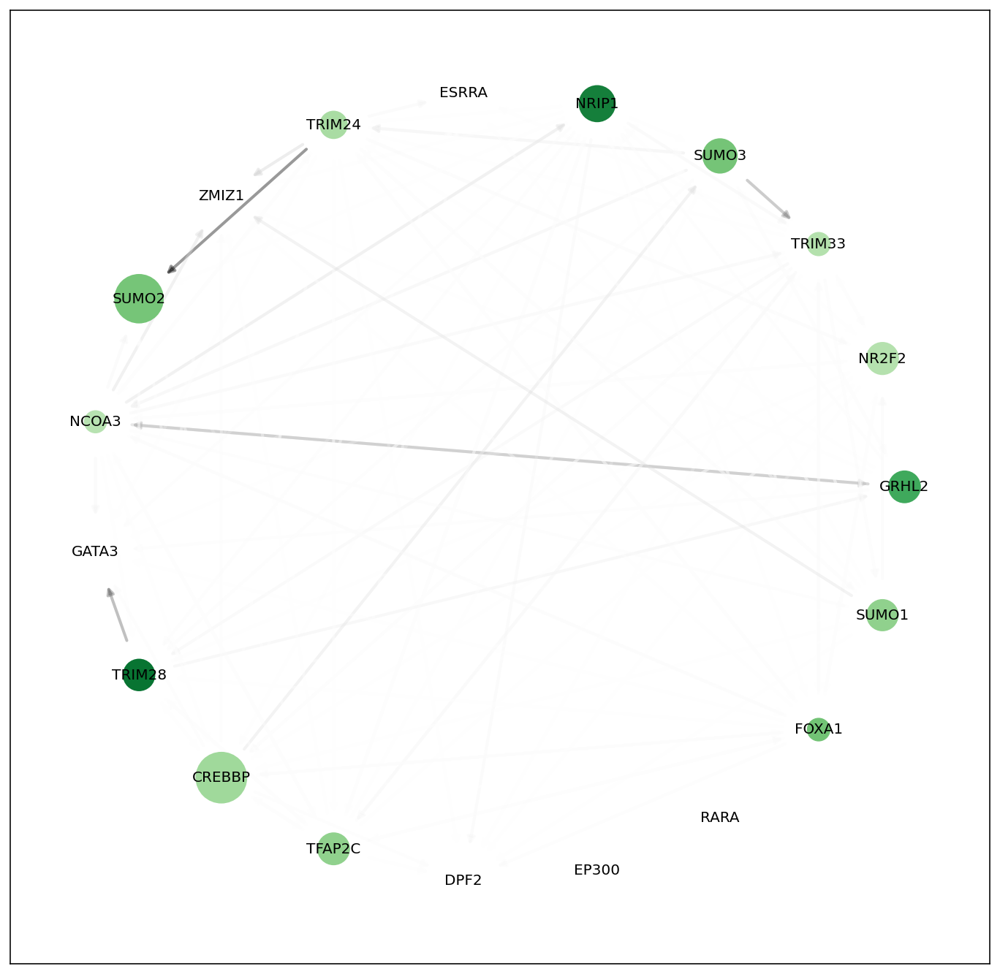

In [34]:
absd = abs(d)
G = nx.DiGraph()
G.add_nodes_from(np.arange(0, len(absd.columns), 1))
labels = {}
node_colors = []
colors = []
sizes = []
for idx, node in enumerate(G.nodes()):
    labels[node] = absd.columns.values[idx]
for i in range(0, len(absd.columns)):
    sizes.append(300 * np.sum(absd.iloc[i, :]))
    node_colors.append(np.sum(absd.iloc[:, i]))
    for j in range(0, len(absd.columns)):
        if i != j and not np.isnan(absd.iloc[i, j]):
            G.add_edge(i, j)
            colors.append(1/absd.iloc[i, j])
plt.figure(figsize=(12, 12))
pos = nx.circular_layout(G)
nx.draw_networkx_nodes(G, pos, node_color=node_colors, cmap=plt.cm.Greens, node_size=sizes, alpha=1.0)
nx.draw_networkx_edges(G, pos, edge_color=colors, edge_cmap=plt.cm.binary, edge_vmin=0.0, width=2.0, arrowstyle='-|>', alpha=0.4, min_source_margin=25, min_target_margin=25)
nx.draw_networkx_labels(G, pos, labels, font_size=10)
plt.savefig("spearman_correlation_mono.png")
plt.show()

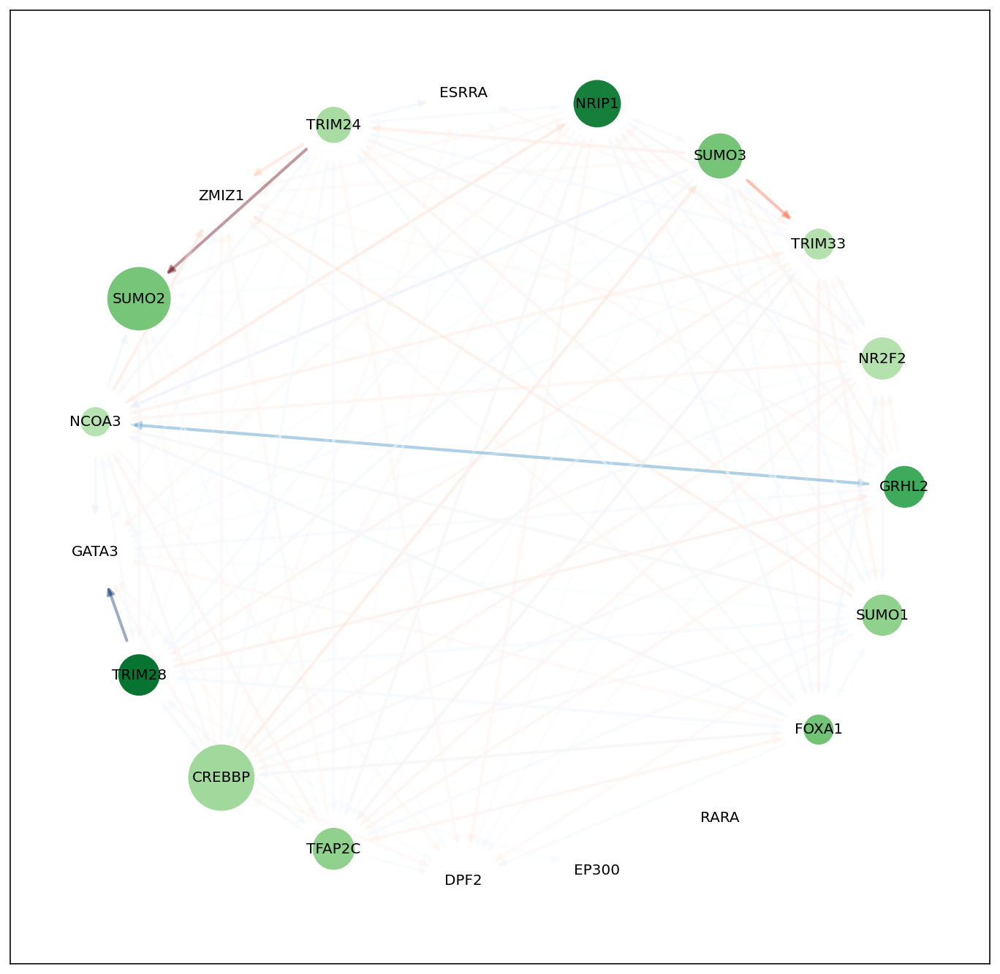

In [35]:
G = nx.DiGraph()
G.add_nodes_from(np.arange(0, len(d.columns), 1))
labels = {}
node_colors = []
pcolors = []
ncolors = []
sizes = []
positive = []
negative = []
for idx, node in enumerate(G.nodes()):
    labels[node] = d.columns.values[idx]
for i in range(0, len(d.columns)):
    sizes.append(500 * np.sum(abs(d.iloc[i, :])))
    node_colors.append(np.sum(abs(d.iloc[:, i])))
    for j in range(0, len(d.columns)):
        if i != j:
            if d.iloc[i, j] > 0:
                G.add_edge(i, j)
                pcolors.append(1/d.iloc[i, j])
                positive.append((i, j))
            elif d.iloc[i, j] < 0:
                G.add_edge(i, j)
                ncolors.append(1/abs(d.iloc[i, j]))
                negative.append((i, j))
plt.figure(figsize=(12, 12))
pos = nx.circular_layout(G)
nx.draw_networkx_nodes(G, pos, node_color=node_colors, cmap=plt.cm.Greens, node_size=sizes, alpha=1.0)
nx.draw_networkx_edges(G, pos, edge_color=pcolors, edgelist= positive, edge_cmap=plt.cm.Reds, edge_vmin=0.0, width=2.0, arrowstyle='-|>', alpha=0.4, min_source_margin=25, min_target_margin=25)
nx.draw_networkx_edges(G, pos, edge_color=ncolors, edgelist= negative, edge_cmap=plt.cm.Blues, edge_vmin=0.0, width=2.0, arrowstyle='-|>', alpha=0.4, min_source_margin=25, min_target_margin=25)
# nx.draw_networkx_edges(G, pos, edge_color="y", edgelist= largest, edge_vmin=0.0, width=2.0, arrowstyle='-|>', alpha=0.4, min_source_margin=25, min_target_margin=25)
nx.draw_networkx_labels(G, pos, labels, font_size=10)
plt.savefig("spearman_correlation_coloured.png")
plt.show()